<!--associate:
# The comment must be at the very beginning of a cell, by itself, starting with 'associate:'. Since it is not meant to appear in the output when run, the assumption is that it can require a cell to itself. This example just refers to a single directory, relative to the notebook.
2018/2018_05/
2018/2018_06/
-->

In [1]:
import pandas as pd
import numpy as np
import scipy as sp
import time
import pylab as pyl
import matplotlib as mpl
import ipywidgets as widgets

from scipy.optimize import leastsq
from scipy.optimize import curve_fit
from scipy.optimize import least_squares

from mpl_toolkits.mplot3d import Axes3D

from importlib import reload

from ipywidgets import interact, interactive, fixed, interact_manual
from ipywidgets import Layout, Button, Box, VBox

from numpy import gradient
from numpy import sqrt
from os.path import join

import warnings
from __future__ import print_function
from matplotlib.widgets import Slider


import matplotlib.pyplot as plt
%matplotlib inline
#%matplotlib notebook

import warnings
#this disables a warning about fractional values in widgets possibly not being supported in the future
warnings.simplefilter(action='ignore', category=FutureWarning)

def onclick(event):
    pos = [blah, x, y, xdata, ydata] % (event.button, event.x, event.y, event.xdata, event.ydata)

def plot_datacube(data,title1,z,data_min,data_max,scale,color):
    #This function creates a figure using 3-dimensional array with size [y,x,z] as inputs. This function
    #is designed to be used used with interact with the z value changing between different 2D plots.
    #X-axis and y-axis ticks are set automatically based off the scale value in the function. Color sets the plot color.
    self = data[:,:,z]
    fig=plt.pcolormesh(self, cmap=color, vmin=data_min, vmax=data_max)
    #convert the x/y ticks from col/row numbers to actual values set by 'scale'
    plt.yticks(np.arange(0,len(self[:,1]),step=5),np.arange(0, scale*len(self[:,1]), step=scale*len(self[:,1])/5))
    plt.xticks(np.arange(0,len(self[1,:]),step=10),np.arange(0, scale*len(self[1,:]), step=scale*len(self[1,:])/10))
    
    plt.title(title1)
    plt.colorbar()
    plt.axes().set_aspect('equal')
    plt.show()
    time.sleep(.001) #this helps with flickering as the z value is changed
    
def plot_datacube_2x1(data1,title1,data2,title2,z,data_min,data_max,scale,color):
    #This function creates a two-plot figure using 3-dimensional arrays with size [y,x,z] as inputs. This function
    #is designed to be used used with interact with the z value changing between different 2D plots.
    #X-axis and y-axis ticks are set automatically based off the scale parameter (given in units/px). Color sets the plot color.
    self1 = data1[:,:,z]
    self2 = data2[:,:,z]
    plt.figure(figsize=(16,4))
    plt.subplot(1, 2, 1)
    plt.pcolormesh(self1, cmap=color, vmin=data_min, vmax=data_max)
    plt.yticks(np.arange(0,len(self1[:,1]),step=5),np.arange(0, scale*len(self1[:,1]), step=scale*len(self1[:,1])/10))
    plt.xticks(np.arange(0,len(self1[1,:]),step=10),np.arange(0, scale*len(self1[1,:]), step=scale*len(self1[1,:])/10))
    plt.title(title1)
    # set the limits of the plot to the limits of the data
    plt.colorbar()
    #plt.clabel('Voltage (uV)')

    plt.subplot(1, 2, 2)
    plt.pcolormesh(self2, cmap=color, vmin=data_min, vmax=data_max)
    plt.yticks(np.arange(0,len(self2[:,1]),step=5),np.arange(0, scale*len(self2[:,1]), step=scale*len(self2[:,1])/10))
    plt.xticks(np.arange(0,len(self2[1,:]),step=10),np.arange(0, scale*len(self2[1,:]), step=scale*len(self2[1,:])/10))
    plt.title(title2)
    plt.colorbar()
    #plt.subplots_adjust(wspace=0.5, hspace=0.5)

    plt.show() 
    time.sleep(.01) #this helps with flickering as the z value is changed

def plot_datacube_2x2(data1,title1,data2,title2,data3,title3,data4,title4,z,scale,color):
    #This function creates a four-plot figure using 3-dimensional arrays with size [y,x,z] as inputs. This function
    #is designed to be used used with interact with the z value changing between different 2D plots.
    #X-axis and y-axis ticks are set automatically based off the scale parameter (given in units/px). Color sets the plot color.
    self1 = data1[:,:,z]
    self2 = data2[:,:,z]
    self3 = data3[:,:,z]
    self4 = data4[:,:,z]
    plt.figure(figsize=(16,8))
    plt.subplot(2, 2, 1)
    plt.pcolormesh(self1, cmap=color)# , vmin=data1.min(), vmax=data1.max())
    plt.yticks(np.arange(0,len(self1[:,1]),step=5),np.arange(0, scale*len(self1[:,1]), step=scale*len(self1[:,1])/10))
    plt.xticks(np.arange(0,len(self1[1,:]),step=10),np.arange(0, scale*len(self1[1,:]), step=scale*len(self1[1,:])/10))
    #plt.title('pcolor')
    #set the limits of the plot to the limits of the data
    plt.colorbar()
    plt.title(title1)

    plt.subplot(2, 2, 2)
    plt.pcolormesh(self2, cmap=color) #, vmin=data2.min(), vmax=data2.max())
    plt.yticks(np.arange(0,len(self2[:,1]),step=5),np.arange(0, scale*len(self2[:,1]), step=scale*len(self2[:,1])/10))
    plt.xticks(np.arange(0,len(self2[1,:]),step=10),np.arange(0, scale*len(self2[1,:]), step=scale*len(self2[1,:])/10))
    
    plt.colorbar()
    plt.title(title2)
    
    plt.subplot(2, 2, 3)
    plt.pcolormesh(self3, cmap=color) #, vmin=data3.min(), vmax=data3.max())
    plt.yticks(np.arange(0,len(self3[:,1]),step=5),np.arange(0, scale*len(self3[:,1]), step=scale*len(self3[:,1])/10))
    plt.xticks(np.arange(0,len(self3[1,:]),step=10),np.arange(0, scale*len(self3[1,:]), step=scale*len(self3[1,:])/10))
    
    plt.colorbar()
    plt.title(title3)
    
    plt.subplot(2, 2, 4)
    plt.pcolormesh(self4, cmap=color) #, vmin=data4.min(), vmax=data4.max())
    plt.yticks(np.arange(0,len(self4[:,1]),step=5),np.arange(0, scale*len(self4[:,1]), step=scale*len(self4[:,1])/10))
    plt.xticks(np.arange(0,len(self4[1,:]),step=10),np.arange(0, scale*len(self4[1,:]), step=scale*len(self4[1,:])/10))
    
    plt.colorbar()
    plt.title(title4)

    plt.subplots_adjust(hspace=0.5)

    plt.show() 
    time.sleep(.01) #this helps with flickering as the z value is changed
    
def seebeck(data):
    #This function takes an array with dimension [x,y,z] combines the first z/2 arrays with the last z/2 arrays in
    #order to extract the symmetric and anti-symmetric components of the data.
    #For example, the first array returned in data_see will be equal to (data[x,y,0]+data[x,y,N/2])/2. 
    #data_see_avg is a 2D array that is the z-average of all data_see arrays
    #The first array returned in data_sse will be data[x,y,0]-data_see_avg
    rows, cols, N = data.shape
    s=int(len(data[1,1,:])/2)
    data_see = np.zeros((rows,cols,N-s))
    data_sse = np.zeros((rows,cols,N))
    data_see_avg = np.zeros((rows,cols))
    for i in range(N-s):
        data_see[:,:,i] = (data[:,:,i]+data[:,:,i+s])/4 #extra factor of 4 accounts for averaging and voltage scaling from lockin
        data_see_avg[:,:] = (data_see_avg[:,:])+data_see[:,:,i]
    data_see_avg[:,:] = data_see_avg[:,:]/(N-s)
    for i in range(N):
        data_sse[:,:,i] = data[:,:,i]/2-data_see_avg #extra factor of 2 accounts for voltage scaling from lockin
    return data_sse, data_see, data_see_avg;

def seebeck_4D(data):
    #This function takes an array with dimension [x,y,z] combines the first z/2 arrays with the last z/2 arrays in
    #order to extract the symmetric and anti-symmetric components of the data.
    #For example, the first array returned in data_see will be equal to (data[x,y,0]+data[x,y,N/2])/2. 
    #data_see_avg is a 2D array that is the z-average of all data_see arrays
    #The first array returned in data_sse will be data[x,y,0]-data_see_avg
    rows, cols, N, phi = data.shape
    s=int(len(data[1,1,:,1])/2)
    data_see = np.zeros((rows,cols,N-s,phi))
    data_sse = np.zeros((rows,cols,N,phi))
    data_see_avg = np.zeros((rows,cols,phi))
    for j in range(phi):    
        for i in range(N-s):
            data_see[:,:,i,j] = (data[:,:,i,j]+data[:,:,i+s,j])/4 #extra factor of 4 accounts for averaging and voltage scaling from lockin
            data_see_avg[:,:,j] = (data_see_avg[:,:,j])+data_see[:,:,i,j]
        data_see_avg[:,:,j] = data_see_avg[:,:,j]/(N-s)
        for i in range(N):
            data_sse[:,:,i,j] = data[:,:,i,j]/2-data_see_avg[:,:,j] #extra factor of 2 accounts for voltage scaling from lockin
    return data_sse, data_see, data_see_avg;

def mag_field_pointer(data1,theta1,phi1,x_pos,y_pos,phase,scale):
    soa = np.array([[0, 0, 0,np.sin((theta1-phase)/57.3)*np.cos(phi1/57.3), np.cos((theta1-phase)/57.3)*np.cos(phi1/57.3), np.sin(phi1/57.3)]])
    theta=int(theta1/20)
    phi=int(phi1/15)
    
    
    x_int = int(x_pos/scale)
    y_int = int(y_pos/scale)
    X, Y, Z, U, V, W = zip(*soa)
    fig = plt.figure()
    fig=plt.figure(figsize=(8,8))
    ax = fig.add_subplot(111, projection='3d')
    ax = fig.gca(projection='3d')
    cols, rows, T, P = data1.shape
    X1 = np.arange(int(-rows/2), int(rows/2), 1)
    Y1 = np.arange(int(-cols/2), int(cols/2), 1)
    X1, Y1 = np.meshgrid(X1, Y1)
    Z1 = data1[:,:,theta,phi]
    levels=np.arange(Z1.min(),1.02*Z1.max(),(1.02*Z1.max()-data1.min())/100)
    
    ax.quiver(X, Y, Z, U, V, W, lw='3', length=cols, zorder=1, color=[0,0,0], pivot='tail')
    ax.quiver(-(int(rows/2)), Y, Z, 0, V, W, lw='3', zorder=1, color=[0.5,0.2,0.8], length=np.sqrt((cols*np.cos((theta1-phase)/57.3)*np.cos(phi1/57.3)) ** 2 + (cols*np.sin(phi1/57.3))**2), pivot='tail')
    ax.quiver(X, (int(cols/2)), Z, U, 0, W, lw='3', zorder=1, color=[0.2,0.8,0.5], length=np.sqrt((cols*np.sin((theta1-phase)/57.3)*np.cos(phi1/57.3)) ** 2 + (cols*np.sin(phi1/57.3))**2), pivot='tail')
    ax.quiver(X, Y, 0, U, V, 0, lw='3', label='Bxy', zorder=1, color=[0.8,0.2,0.2], length=np.sqrt((cols*np.sin((theta1-phase)/57.3)*np.cos(phi1/57.3)) ** 2 + (cols*np.cos((theta1-phase)/57.3)*np.cos(phi1/57.3)) ** 2), pivot='tail')
    
    cset = ax.contourf(X1, Y1, Z1, zdir='z', levels=levels, offset=-3, cmap='viridis',zorder=0)
    #plt.plot([int(-rows/2),int(rows/2)],[x_int-50,x_int-50],[0,0],'-',color="aqua", lw=2, zorder=15)
    #plt.plot([y_int-50,y_int-50],[int(-cols/2),int(cols/2)],[0,0],'-',color="peru", lw=2, zorder=15)
    ax.set_xlim([-rows/2,rows/2])
    ax.set_ylim([-cols/2,cols/2])
    ax.set_zlim([0, rows/2])
    
    ax.set_aspect('2')
    #plt.savefig('F:\MAX\Processed data\Magnetothermals in Pt-YIG\May 2018 angular analysis figs\mag_field_'+str(phi1)+'_'+str(theta1), dpi=None, facecolor='w', edgecolor='w', orientation='portrait', papertype=None, format=None, transparent=False, bbox_inches=None, pad_inches=0.1, frameon=None)


def cube_line_plot(data1,phi1,title1,angles,x_pos,y_pos,B_arr,scale,data_min,data_max,color):
    phi=np.searchsorted(B_arr,phi1)
    lengt=len(data1[0,0,:])
    self1 = data1[:,:,phi]
    x_int = int(x_pos/scale)
    y_int = int(y_pos/scale)
    
    plt.figure(figsize=(16,8))
    plt.subplot(2, 2, 1)
    plt.pcolormesh(self1, cmap=color, vmin=data_min, vmax=data_max)
    plt.plot([0,len(self1[1,:])],[y_int,y_int],'-',color="aqua", lw=2)
    plt.plot([x_int,x_int],[0,len(self1[:,1])],'-',color="peru", lw=2)
    plt.yticks(np.arange(0,len(self1[:,1]),step=5),np.arange(0, scale*len(self1[:,1]), step=scale*len(self1[:,1])/10))
    plt.xticks(np.arange(0,len(self1[1,:]),step=10),np.arange(0, scale*len(self1[1,:]), step=scale*len(self1[1,:])/10))
    plt.ylabel('distance (um)')
    plt.xlabel('distance (um)')
    cbar=plt.colorbar()
    cbar.set_label('Photovoltage (uV)')
    plt.text(10,5,
             "\nBz="+str(round(0.5*np.sin(out_of_plane[phi]/57.3),2))+"T",
             ha="center", va="center", color='white')#, transform=ax1.transAxes)
    plt.title(title1)

    plt.subplot(2, 2, 2)
    for i in range(len(data1[0,0,:])):
        plt.plot(np.arange(0,scale*len(data1[:,1,0+i]),scale), data1[:,x_int,0+i],'-',color=(.5+(.5/lengt)*i,0+(1/lengt)*i,.5-(0.5/lengt)*i))
    plt.axhline(0, color='black')
    plt.axvline(y_pos, color='black')
    #plt.legend(('Phi=0°', 'Phi=15°', 'Phi=30°', 'Phi=45°', 'Phi=60°', 'Phi=75°', 'Phi=85°'),loc='best', fontsize='medium')
    plt.xlabel('distance (um)')
    plt.ylabel('Photovoltage (uV)')
    plt.title('Vertical trace')
    
    plt.subplot(2, 2, 3)
    #plt.plot(np.arange(0,scale*len(data1[1,:,z]),scale), data1[y_int,:,z],color="aqua")
    #plt.plot(scale*x_int, data1[y_int,x_int,z], "ro")
    for i in range(len(data1[0,0,:])):
        plt.plot(np.arange(0,scale*len(data1[1,:,0+i]),scale), data1[y_int,:,0+i],'-',color=(.5+(.5/lengt)*i,0+(1/lengt)*i,.5-(0.5/lengt)*i))
    #plt.plot(theta, data1[y_int,x_int,theta,phi], "ro")
    plt.axhline(0, color='black')
    plt.axvline(x_pos, color='black')
    #plt.legend(('Phi=0°', 'Phi=15°', 'Phi=30°', 'Phi=45°', 'Phi=60°', 'Phi=75°', 'Phi=85°'),loc='best', fontsize='medium')
    plt.xlabel('distance (um)')
    plt.ylabel('Photovoltage (uV)')
    plt.title('Horizontal trace')
    
    plt.subplot(2, 2, 4)
    plt.plot(B_arr, data1[y_int,x_int,:],'-o',color="black")
    plt.plot(B_arr[phi], data1[y_int,x_int,phi], "ro")
    plt.axhline(0, color='black')
    plt.xlabel('Bz (T)')
    plt.ylabel('Photovoltage (uV)')
    plt.title('Out-of-plane magnetic field dependence')
    # set the limits of the plot to the limits of the data

    plt.subplots_adjust(hspace=0.3)

    plt.show()
    
    time.sleep(.01)
    
def cube_line_plot_4D(data1,title1,theta1,phi1,phase,B_arr,x_pos,y_pos,scale,data_min,data_max,color):
    theta=int(theta1/20)
    lengt=len(data1[0,0,0,:])
    phi=np.searchsorted(B_arr,phi1)
    self1 = data1[:,:,theta,phi]
    lentx=len(self1[:,1])
    lenty=len(self1[1,:])
    scalx=scale*lentx
    scaly=scale*lenty
    x_int = int(x_pos/scale)
    y_int = int(y_pos/scale)
    U=np.cos((theta1-phase)/57.3)
    V=np.sin((theta1-phase)/57.3)
    
    fig=plt.figure(figsize=(16,8))
    plt.subplot(2, 2, 1)
    plt.pcolormesh(self1, cmap=color, vmin=data_min, vmax=data_max)
    plt.plot([0,len(self1[1,:])],[y_int,y_int],'-',color="aqua", lw=2)
    plt.plot([x_int,x_int],[0,len(self1[:,1])],'-',color="peru", lw=2)
    plt.yticks(np.arange(0,lentx,step=5),np.arange(0, scalx, step=scalx/10))
    plt.xticks(np.arange(0,lenty,step=10),np.arange(0, scaly, step=scaly/10))
    plt.ylabel('distance (um)')
    plt.xlabel('distance (um)')
    cbar=plt.colorbar()
    cbar.set_label('Photovoltage (uV)')
    plt.quiver(90, 5, U, V, lw=3, scale=10, zorder=1, color=[1,1,1], pivot='mid', edgecolor='white')
    plt.text(10,5,
             "Bx="+str(round(0.5*np.sin(20*theta/57.3)*np.cos(out_of_plane[phi]/57.3),2))
             +"T\nBy="+str(round(0.5*np.cos(20*theta/57.3)*np.cos(out_of_plane[phi]/57.3),2))
             +"T\nBz="+str(round(0.5*np.sin(out_of_plane[phi]/57.3),2))+"T",
             ha="center", va="center", color='white')#, transform=ax1.transAxes)
    plt.title(title1)

    plt.subplot(2, 2, 2)
    for i in range(lengt):
        plt.plot(np.arange(0,scale*len(data1[:,1,theta,0]),scale), data1[:,x_int,theta,0+i],color=(.5+(.5/lengt)*i,0+(1/lengt)*i,.5-(0.5/lengt)*i))
    plt.plot(scale*y_int, data1[y_int,x_int,theta,phi], "ro")
    plt.axhline(0, color='black')
    plt.xlabel('distance (um)')
    plt.ylabel('Photovoltage (uV)')
    plt.title('Vertical trace')
    
    plt.subplot(2, 2, 3)
    for i in range(lengt):
        plt.plot(np.arange(0,scale*len(data1[1,:,theta,0]),scale), data1[y_int,:,theta,0+i],color=(.5+(.5/lengt)*i,0+(1/lengt)*i,.5-(0.5/lengt)*i))
    plt.plot(scale*x_int, data1[y_int,x_int,theta,phi], "ro")
    plt.axhline(0, color='black')
    plt.xlabel('distance (um)')
    plt.ylabel('Photovoltage (uV)')
    #plt.legend(('Phi=0°', 'Phi=30°', 'Phi=45°', 'Phi=60°', 'Phi=75°'),loc='best')
    plt.title('Horizontal trace')
    
    ax4=fig.add_subplot(2, 2, 4)
    for i in range(lengt):
        plt.plot(np.arange(0,20*len(data1[1,1,:,0+i]),20), data1[y_int,x_int,:,0+i],'-o',color=(.5+(.5/lengt)*i,0+(1/lengt)*i,.5-(0.5/lengt)*i))
    plt.plot(20*theta, data1[y_int,x_int,theta,phi], "ro")
    plt.axhline(0, color='black')
    plt.axvline(theta, color='black')
    plt.text(.85,.2,
             "Bx="+str(round(0.5*np.sin(20*theta/57.3)*np.cos(out_of_plane[phi]/57.3),2))
             +"T\nBy="+str(round(0.5*np.cos(20*theta/57.3)*np.cos(out_of_plane[phi]/57.3),2))
             +"T\nBz="+str(round(0.5*np.sin(out_of_plane[phi]/57.3),2)),
             ha="center", va="center", transform=ax4.transAxes)
    plt.xlabel('Magnetic field angle (°)')
    plt.ylabel('Photovoltage (uV)')
    plt.title('In-plane magnetic field dependence')

    plt.subplots_adjust(hspace=0.3)
    plt.show()   
    time.sleep(.01)    

def cube_line_plot_4D_pointer(data1,title1,theta1,phi1,x_pos,y_pos,phase,scale,data_min,data_max,color):
    theta=int(theta1/20)
    phi=int(phi1/15)
    self1 = data1[:,:,theta,phi]
    x_int = int(x_pos/scale)
    y_int = int(y_pos/scale)
    
    soa = np.array([[0, 0, 0,np.sin((theta1-phase)/57.3)*np.cos(phi1/57.3), np.cos((theta1-phase)/57.3)*np.cos(phi1/57.3), np.sin(phi1/57.3)]])
       
    X, Y, Z, U, V, W = zip(*soa)
    fig = plt.figure()
    plt.figure(figsize=(16,8))
    ax=plt.subplot(2, 2, 1, projection='3d')
    cols, rows, T, P = data1.shape
    X1 = np.arange(int(-rows/2), int(rows/2), 1)
    Y1 = np.arange(int(-cols/2), int(cols/2), 1)
    X1, Y1 = np.meshgrid(X1, Y1)
    Z1 = data1[:,:,0,0]

    ax.quiver(X, Y, Z, U, V, W, lw='3', length=cols, zorder=1, color=[0,0,0], pivot='tail')
    ax.quiver(-(int(rows/2)), Y, Z, 0, V, W, lw='3', zorder=1, color=[0.5,0.2,0.8], length=np.sqrt((cols*np.cos((theta1-phase)/57.3)*np.cos(phi1/57.3)) ** 2 + (cols*np.sin(phi1/57.3))**2), pivot='tail')
    ax.quiver(X, (int(cols/2)), Z, U, 0, W, lw='3', zorder=1, color=[0.2,0.8,0.5], length=np.sqrt((cols*np.sin((theta1-phase)/57.3)*np.cos(phi1/57.3)) ** 2 + (cols*np.sin(phi1/57.3))**2), pivot='tail')
    ax.quiver(X, Y, 0, U, V, 0, lw='3', label='Bxy', zorder=1, color=[0.8,0.2,0.2], length=np.sqrt((cols*np.sin((theta1-phase)/57.3)*np.cos(phi1/57.3)) ** 2 + (cols*np.cos((theta1-phase)/57.3)*np.cos(phi1/57.3)) ** 2), pivot='tail')
    
    cset = ax.contourf(X1, Y1, Z1, zdir='z', offset=-3, cmap='viridis',zorder=0)
    plt.plot([int(-rows/2),int(rows/2)],[y_int-50,y_int-50],[0,0],'-',color="aqua", lw=2, zorder=15)
    plt.plot([x_int-50,x_int-50],[int(-cols/2),int(cols/2)],[0,0],'-',color="peru", lw=2, zorder=15)
    ax.set_xlim([-rows/2,rows/2])
    ax.set_ylim([-cols/2,cols/2])
    ax.set_zlim([0, rows/2])
    ax.set_aspect('2')
    plt.ylabel('distance (um)')
    plt.xlabel('distance (um)')
    plt.title(title1)

    plt.subplot(2, 2, 2)
    for i in range(len(data1[0,0,0,:])):
        plt.plot(np.arange(0,scale*len(data1[:,1,theta,0]),scale), data1[:,x_int,theta,0+i],color=(.5+(.5/len(data1[0,0,0,:]))*i,0+(1/len(data1[0,0,0,:]))*i,.5-(0.5/len(data1[0,0,0,:]))*i))
    plt.plot(scale*y_int, data1[y_int,x_int,theta,phi], "ro")
    plt.axhline(0, color='black')
    plt.xlabel('distance (um)')
    plt.title('Vertical trace')
    
    plt.subplot(2, 2, 3)
    for i in range(len(data1[0,0,0,:])):
        plt.plot(np.arange(0,scale*len(data1[1,:,theta,0]),scale), data1[y_int,:,theta,0+i],color=(.5+(.5/len(data1[0,0,0,:]))*i,0+(1/len(data1[0,0,0,:]))*i,.5-(0.5/len(data1[0,0,0,:]))*i))
    plt.plot(scale*x_int, data1[y_int,x_int,theta,phi], "ro")
    plt.axhline(0, color='black')
    plt.xlabel('distance (um)')
    #plt.legend(('Phi=0°', 'Phi=30°', 'Phi=45°', 'Phi=60°', 'Phi=75°'),loc='best')
    plt.title('Horizontal trace')
    
    plt.subplot(2, 2, 4)
    for i in range(len(data1[0,0,0,:])):
        plt.plot(np.arange(0,20*len(data1[1,1,:,0+i]),20), data1[y_int,x_int,:,0+i],'-o',color=(.5+(.5/len(data1[0,0,0,:]))*i,0+(1/len(data1[0,0,0,:]))*i,.5-(0.5/len(data1[0,0,0,:]))*i))
    #plt.plot(theta, data1[y_int,x_int,theta,phi], "ro")
    plt.axhline(0, color='black')
    plt.axvline(theta, color='black')
    plt.legend(['Phi=0°', 'Phi=15°', 'Phi=30°', 'Phi=45°', 'Phi=60°', 'Phi=75°', 'Phi=85°'],loc='best', fontsize='medium')
    plt.xlabel('Angle (°)')
    plt.title('Angle trace')
    # set the limits of the plot to the limits of the data

    plt.subplots_adjust(hspace=0.3)

    plt.show()
    
    time.sleep(.01)    

    
def cube_linefit_plot(data1,title1,data2,data3,title3,theta1,phi1,x_pos,y_pos,B_arr,scale,data_min,data_max,color):
    lengt=len(data1[0,0,:])
    theta=int(theta1/20)
    phi=np.searchsorted(B_arr,phi1)
    self1 = data1[:,:,theta,phi]
    self2 = data3[:,:,theta,phi]
    rows, cols, N, z = data1.shape
    lentx=len(self1[:,1])
    lenty=len(self1[1,:])
    scalx=scale*lentx
    scaly=scale*lenty
    t = np.linspace(0, 2*np.pi, N)
    #t = np.linspace(0, 2*np.pi/9, N)
    x_int = int(x_pos/scale)
    y_int = int(y_pos/scale)
    plt.figure(figsize=(16,8))
    plt.subplot(2, 2, 1)
    plt.pcolormesh(self1, cmap=color, vmin=data_min, vmax=data_max)
    plt.plot([0,len(self1[1,:])],[y_int,y_int],'w-', lw=2)
    plt.plot([x_int,x_int],[0,len(self1[:,1])],'w-', lw=2)
    plt.yticks(np.arange(0,lentx,step=5),np.arange(0, scalx, step=scalx/10))
    plt.xticks(np.arange(0,lenty,step=10),np.arange(0, scaly, step=scaly/10))
    # set the limits of the plot to the limits of the data
    plt.title(title1)
    plt.colorbar()

    plt.subplot(2, 2, 2)
    plt.plot(np.arange(0,N,1), data1[y_int,x_int,:,phi],'o-',color="black", lw=3)
    #plt.plot(data2[0][y_int,x_int]*np.sin(t+data2[1][y_int,x_int]) + data2[2][y_int,x_int])
    plt.plot(data2[0][y_int,x_int,phi]*np.sin(t+data2[1][y_int,x_int,phi]/57.3) + data2[2][y_int,x_int,phi],'r-', lw=3)
    plt.plot(data1[y_int,x_int,:,phi] - (data2[0][y_int,x_int,phi]*np.sin(t+data2[1][y_int,x_int,phi]/57.3) + data2[2][y_int,x_int,phi]),'b-', lw=3)
    plt.axhline(0, color='black')
    plt.axvline(theta, color='silver')
    plt.legend(('Data', 'Fit', 'Data-fit'),loc='best')
    plt.title('Data, Fit, and Difference vs Angle')
    
    b=np.zeros([rows,cols])
    for i in range(rows):
        for j in range(cols):
            b[i,j]=(np.std(data1[i,j,:,phi] - (data2[0][i,j,phi]*np.sin(t+data2[1][i,j,phi]/57.3) + data2[2][i,j,phi])))
    plt.subplot(2, 2, 3)
    plt.pcolormesh(b, cmap=color, vmin=b[(5):(rows-5),(5):(cols-5)].min(), vmax=b[(5):(rows-5),(5):(cols-5)].max())
    plt.plot(x_int,y_int,'wo')
    plt.colorbar()
    plt.title('Std. dev of Data-Fit difference \n Larger value means worse fit')
    plt.subplots_adjust(hspace=0.35)

    plt.subplot(2, 2, 4)
    plt.pcolormesh(self2, cmap=color, vmin=self2.min(), vmax=self2.max())
    plt.plot([0,len(self2[1,:])],[y_int,y_int],'w-', lw=2)
    plt.plot([x_int,x_int],[0,len(self2[:,1])],'w-', lw=2)
    plt.yticks(np.arange(0,lentx,step=5),np.arange(0, scalx, step=scalx/10))
    plt.xticks(np.arange(0,lenty,step=10),np.arange(0, scaly, step=scaly/10))
    plt.title(title3)
    plt.colorbar()
    
    plt.show()
    time.sleep(.01)
    
def spatial_sinefit(data):
    #this function takes an [x,y,z] dataset and fits every x,y point across the z dimension with a sine function. 
    #It then saves the fit parameters as a function of x,y location.
    data1 = data
    rows, cols, N = data1.shape
    t = np.linspace(0, 2*np.pi, N)
    #create empty 
    est_std=np.zeros([rows,cols])
    est_phase=np.zeros([rows,cols])
    est_mean=np.zeros([rows,cols])    
    
    #initial guess for phase
    guess_phase = 0
    
    
    #step through every x,y point and fit with a sine function in the z direction
    for i in range(rows):
        for j in range(cols):
            # 
            data=data1[i,j,:]
            # guess the amplitude as the maximum in the z direction and offset as the mean in the z direction
            guess_std=abs(data.max())
            guess_mean=np.mean(data)
            # Define the function to optimize, in this case, we want to minimize the difference
            # between the actual data and our "guessed" parameters
            optimize_func = lambda x: x[0]*np.sin(t+x[1]) + x[2] - data
            #fit the function with bounds
            fit =least_squares(optimize_func, [guess_std, guess_phase, guess_mean],bounds=([0, -2*np.pi, -np.inf], [np.inf, 2*np.pi, np.inf]),method='trf')
            #store fit parameters at every x,y point
            est_std[i,j]=fit.x[0]
            est_phase[i,j]=(360/(2*np.pi))*fit.x[1]
            est_mean[i,j]=fit.x[2]
           
    return est_std, est_phase, est_mean

def spatial_sinefit2(data,w):
    #this is the same as the original spatial_sinefit but attempts to include a variable angular frequency.
    #It does not work well.
    data1 = data
    rows, cols, N = data1.shape
    #t = np.linspace(0, 2*np.pi, N)
    t = np.linspace(0, 2*np.pi/9, N)
    est_std=np.zeros([rows,cols])
    est_phase=np.zeros([rows,cols])
    est_mean=np.zeros([rows,cols])    

    #guess_mean = np.mean(data1)
    #guess_std = 3*np.std(data1)/(2**0.5)
    guess_phase = 0
    #optimize_func = lambda x: x[0]*np.sin(t+x[1]) + x[2]
    
    
    for i in range(rows):
        for j in range(cols):
            data=data1[i,j,:]
            # we'll use this to plot our first estimate. This might already be good enough for you
            guess_std=abs(data.max())
            guess_mean=np.mean(data)
            # Define the function to optimize, in this case, we want to minimize the difference
            # between the actual data and our "guessed" parameters
            optimize_func = lambda x: x[0]*np.sin(2*np.pi*(t+x[1])/w) + x[2] - data
            fit =least_squares(optimize_func, [guess_std, guess_phase, guess_mean],bounds=([0, -2*np.pi, -np.inf], [np.inf, 2*np.pi, np.inf]),method='trf')
            est_std[i,j]=fit.x[0]
            est_phase[i,j]=(360/(2*np.pi))*fit.x[1]
            est_mean[i,j]=fit.x[2]
           
    return est_std, est_phase, est_mean

def spatial_sinefit_4D(data):
    #this function takes an [x,y,z,phi] dataset and fits every x,y point across the z dimension with a sine function. 
    #It then saves the fit parameters as a function of x,y location.
    data1 = data
    rows, cols, N, phi = data1.shape
    t = np.linspace(0, 2*np.pi, N)
    #create empty 
    est_std=np.zeros([rows,cols,phi])
    est_phase=np.zeros([rows,cols,phi])
    est_mean=np.zeros([rows,cols,phi])    
    
    #initial guess for phase
    guess_phase = 0
    
    
    #step through every x,y point and fit with a sine function in the z direction
    for k in range(phi):
        for i in range(rows):
            for j in range(cols):
                # 
                data=data1[i,j,:,k]
                # guess the amplitude as the maximum in the z direction and offset as the mean in the z direction
                guess_std=abs(data.max())
                guess_mean=np.mean(data)
                # Define the function to optimize, in this case, we want to minimize the difference
                # between the actual data and our "guessed" parameters
                optimize_func = lambda x: x[0]*np.sin(t+x[1]) + x[2] - data
                #fit the function with bounds
                fit =least_squares(optimize_func, [guess_std, guess_phase, guess_mean],bounds=([0, -2*np.pi, -np.inf], [np.inf, 2*np.pi, np.inf]),method='trf')
                #store fit parameters at every x,y point
                est_std[i,j,k]=fit.x[0]
                est_phase[i,j,k]=(360/(2*np.pi))*fit.x[1]
                est_mean[i,j,k]=fit.x[2]
           
    return est_std, est_phase, est_mean

def spatial_linefit(data, angles):
    #this function takes an [x,y,z] dataset and fits every x,y point across the z dimension with a sine function. 
    #It then saves the fit parameters as a function of x,y location.
    data1 = data
    rows, cols, N = data1.shape
    t = angles
    #create empty 
    slope=np.zeros([rows,cols])
    offset=np.zeros([rows,cols])
    rsq=np.zeros([rows,cols])        
    
    #step through every x,y point and fit with a linear fit in the z direction
    for i in range(rows):
        for j in range(cols):
            # 
            data2=data1[i,j,:]
            # guess the amplitude as the maximum in the z direction and offset as the mean in the z direction
            guess_slope=(data2[0]-data2[N-1])/2
            guess_offset=np.mean(data)
            # Define the function to optimize, in this case, we want to minimize the difference
            # between the actual data and our "guessed" parameters
            optimize_func = lambda x: x[0]*t + x[1] - data2
            #fit the function with bounds
            fit =least_squares(optimize_func, [guess_slope, guess_offset],bounds=([-np.inf, -np.inf], [np.inf, np.inf]),method='trf')
            #store fit parameters at every x,y point
            slope[i,j]=fit.x[0]
            offset[i,j]=fit.x[1]
            dfit=fit.x[0]*t+fit.x[1]
            ss_res=np.sum((data2 - dfit)**2)
            ss_tot=np.sum((data2 - np.mean(data2))**2)
            rsq[i,j] = 1 - (ss_res / ss_tot)
    
    return slope, offset, rsq

def spatial_line_and_sinefit(data, angles):
    #this function takes an [x,y,z] dataset and fits every x,y point across the z dimension with a sine function. 
    #It then saves the fit parameters as a function of x,y location.
    data1 = data
    rows, cols, N = data1.shape
    t = angles
    #create empty 
    slope=np.zeros([rows,cols])
    offset=np.zeros([rows,cols])
    rsq=np.zeros([rows,cols])    
    est_std=np.zeros([rows,cols])
    est_phase=np.zeros([rows,cols])
    est_mean=np.zeros([rows,cols])
    guess_phase = 0
    
    #step through every x,y point and fit with a linear fit in the z direction
    for i in range(rows):
        for j in range(cols):
            # 
            data2=data1[i,j,:]
            # guess the amplitude as the maximum in the z direction and offset as the mean in the z direction
            guess_slope=(data2[0]-data2[N-1])/2
            guess_offset=np.mean(data)
            guess_std=abs(data.max())-guess_offset
            # Define the function to optimize, in this case, we want to minimize the difference
            # between the actual data and our "guessed" parameters
            optimize_func = lambda x: (x[0]*t + x[1]) + (x[2]*np.sin(t+x[3]) + x[4]) - data2
            #fit the function with bounds
            fit =least_squares(optimize_func, [guess_slope, guess_offset, guess_std, guess_phase, guess_offset],bounds=([-np.inf, -np.inf,0, -2*np.pi, -np.inf], [np.inf, np.inf, np.inf, 2*np.pi, np.inf]),method='trf')
            #store fit parameters at every x,y point
            slope[i,j]=fit.x[0]
            offset[i,j]=fit.x[1]
            est_std = fit.x[2]
            est_phase = fit.x[3]
            est_mean = fit.x[4]
            dfit=(fit.x[0]*t+fit.x[1]) + (fit.x[2]*np.sin(t+fit.x[3]) + fit.x[4])
            ss_res=np.sum((data2 - dfit)**2)
            ss_tot=np.sum((data2 - np.mean(data2))**2)
            rsq[i,j] = 1 - (ss_res / ss_tot)
    
    return slope, offset, A, phase, sine_offset, rsq

def cube_plot_4D(data1,title1,theta1,phi1,phase,B_arr,x_pos,y_pos,scale,color):
    theta=int(theta1/20)
    lengt=len(data1[0,0,0,:])
    phi=np.searchsorted(B_arr,phi1)
    self1 = data1[:,:,theta,phi]
    lentx=len(self1[:,1])
    lenty=len(self1[1,:])
    scalx=scale*lentx
    scaly=scale*lenty
    x_int = int(x_pos/scale)
    y_int = int(y_pos/scale)
    U=np.cos((theta1-phase)/57.3)
    V=np.sin((theta1-phase)/57.3)
    
    fig=plt.figure(figsize=(8,4))
    plt.pcolormesh(self1, cmap=color)
    plt.plot([0,len(self1[1,:])],[y_int,y_int],'-',color="aqua", lw=2)
    plt.plot([x_int,x_int],[0,len(self1[:,1])],'-',color="peru", lw=2)
    plt.yticks(np.arange(0,lentx,step=5),np.arange(0, scalx, step=scalx/10))
    plt.xticks(np.arange(0,lenty,step=10),np.arange(0, scaly, step=scaly/10))
    plt.ylabel('distance (um)')
    plt.xlabel('distance (um)')
    cbar=plt.colorbar()
    cbar.set_label('Photovoltage (uV)')
    plt.quiver(90, 5, U, V, lw=3, scale=10, zorder=1, color=[1,1,1], pivot='mid', edgecolor='white')
    plt.text(10,5,
             "Bx="+str(round(0.5*np.sin(20*theta/57.3)*np.cos(out_of_plane[phi]/57.3),2))
             +"T\nBy="+str(round(0.5*np.cos(20*theta/57.3)*np.cos(out_of_plane[phi]/57.3),2))
             +"T\nBz="+str(round(0.5*np.sin(out_of_plane[phi]/57.3),2))+"T",
             ha="center", va="center", color='white')#, transform=ax1.transAxes)
    plt.title(title1)
    plt.savefig('F:\MAX\Processed data\Magnetothermals in Pt-YIG\May 2018 angular analysis figs\sse\sse_'+str(phi1)+'_'+str(theta1)+'.png', dpi=None, facecolor='w', edgecolor='w', orientation='portrait', papertype=None, format=None, transparent=False, bbox_inches=None, pad_inches=0.1, frameon=None)
    plt.show()
    time.sleep(.01)
    
def cube_plot_3D(data1,title1,theta1,phi1,B_arr,x_pos,y_pos,scale,color):
    lengt=len(data1[0,0,:])
    phi=np.searchsorted(B_arr,phi1)
    self1 = data1[:,:,phi]
    lentx=len(self1[:,1])
    lenty=len(self1[1,:])
    scalx=scale*lentx
    scaly=scale*lenty
    x_int = int(x_pos/scale)
    y_int = int(y_pos/scale)
    #U=np.cos((theta1-90)/57.3)
    #V=np.sin((theta1-90)/57.3)
    
    fig=plt.figure(figsize=(8,4))
    plt.pcolormesh(self1, cmap=color, vmin=0)
    plt.plot([0,len(self1[1,:])],[y_int,y_int],'-',color="aqua", lw=2)
    plt.plot([x_int,x_int],[0,len(self1[:,1])],'-',color="peru", lw=2)
    plt.yticks(np.arange(0,lentx,step=5),np.arange(0, scalx, step=scalx/10))
    plt.xticks(np.arange(0,lenty,step=10),np.arange(0, scaly, step=scaly/10))
    plt.ylabel('distance (um)')
    plt.xlabel('distance (um)')
    cbar=plt.colorbar()
    cbar.set_label('Photovoltage (uV)')
    plt.title(title1)
    plt.savefig('F:/MAX/Processed data/Magnetothermals in Pt-YIG/May 2018 angular analysis figs/fits/sse_'+str(phi1)+'.png', dpi=None, facecolor='w', edgecolor='w', orientation='portrait', papertype=None, format=None, transparent=False, bbox_inches=None, pad_inches=0.1, frameon=None)
    plt.show()
    time.sleep(.01)

In [2]:
directory = '2018/2018_05/' #where the data at?
scale = 3.9; #number of microns per pixel (may vary depending on resolution of scan)
color = 'viridis' #plot color
out_of_plane = np.array([-85,-75,-60,-45,-30,0,15,30,45,60,75,85])
in_plane=np.arange(0,340,20)
Bz=np.zeros([len(out_of_plane)])
for i in range(len(out_of_plane)):
    Bz[i]=round(0.5*np.sin(out_of_plane[i]/57.3),2)

![Contact roadmap](2018/2018_05/roadmap_hall_bar_3-20-2018.png)

In [3]:
run1 = 'may_master_pci_corrected_pow_adj'
run2 = 'may_master_rfi_corrected_pow_adj'
run3 = 'may_master_sinefit_pow_adj'
run4 = 'may_master_seebeck_subtracted_pow_adj'
run5 = 'may_master_seebeck_pow_adj'
run6 = 'may_master_seebeck_avg_pow_adj'
run7 = 'may_master_linefit'

pc1 = np.load(join(directory,run1+'.npy'))
rf1 = np.load(join(directory,run2+'.npy'))
sine1 = np.load(join(directory,run3+'.npy'))#[3,50,100,6] spatial sinefit parameters array. 
                                            #sine1[0] is amplitude, sine1[1] is phase, sine1[2] is offset
line1 = np.load(join(directory,run7+'.npy'))#[2,50,100,6] spatial linefit parameters array.
                                            #line1[0] is slope, line1[1] is offset, line1[2] is R^2
    
sse = np.load(join(directory,run4+'.npy')) #Seebeck effect subtracted photovoltage maps
seeb = np.load(join(directory,run5+'.npy')) #Seebeck effect at different angles
see_avg = np.load(join(directory,run6+'.npy')) #Seebeck effect averaged across all angles


# Magnetic field direction and reflection/photovoltage

In [ ]:
interact(mag_field_pointer, data1=fixed(rf1), title1=fixed('Reflection (drift-corrected)'),phase=fixed(0),theta1=(0,340,20),phi1=(-90,90,15),x_pos=fixed(0), y_pos=fixed(0),scale=fixed(scale),data_min=(rf1.min()),data_max=rf1.max(),color=fixed(color))
#interact(mag_field_pointer, data1=fixed(sse), title1=fixed('Reflection (drift-corrected)'),phase=fixed(0),theta1=(0,340,20),phi1=(-90,90,15),x_pos=fixed(0), y_pos=fixed(0),scale=fixed(scale),data_min=(rf1.min()),data_max=rf1.max(),color=fixed(color))

# Drift- and power-corrected reflection

In [ ]:
interact(cube_line_plot_4D, data1=fixed(rf1),title1=fixed('Reflection (drift-corrected)'),theta1=(0,340,20),phi1=Bz,x_pos=200,y_pos=100,scale=fixed(scale),B_arr=fixed(Bz),data_min=(rf1.min()),data_max=rf1.max(),color=fixed(color))

# Drift- and power-corrected SSE photovoltage

In [7]:
interact(cube_line_plot_4D, data1=fixed(sse),title1=fixed('Seebeck-subtracted photovoltage'),theta1=(0,340,20),phase=fixed(90),phi1=(Bz),x_pos=200,y_pos=100,scale=fixed(scale),B_arr=fixed(Bz),data_min=(sse.min()),data_max=sse.max(),color=fixed(color))

interactive(children=(IntSlider(value=160, description='theta1', max=340, step=20), Dropdown(description='phi1…

<function __main__.cube_line_plot_4D(data1, title1, theta1, phi1, phase, B_arr, x_pos, y_pos, scale, data_min, data_max, color)>

# Spatial Seebeck voltage

In [8]:
interact(cube_line_plot_4D, data1=fixed(seeb),title1=fixed('Seebeck effect photovoltage'),theta1=(0,160,20),phase=fixed(90),phi1=(Bz),x_pos=200,y_pos=100,scale=fixed(scale),B_arr=fixed(Bz),data_min=(seeb.min()),data_max=seeb.max(),color=fixed(color))

interactive(children=(IntSlider(value=80, description='theta1', max=160, step=20), Dropdown(description='phi1'…

<function __main__.cube_line_plot_4D(data1, title1, theta1, phi1, phase, B_arr, x_pos, y_pos, scale, data_min, data_max, color)>

In [9]:
def plot_traces(y_loc):
    fig=plt.figure(figsize=(16,4))
    plt.subplot(1,2,1)
    plt.pcolormesh(rf1[:,:,0,0], cmap=color)
    plt.axhline(y_loc,color='white')
    plt.subplot(1,2,2)
    plt.plot(3*rf1[y_loc,:,0,0]-2.5)
    plt.plot(seeb[y_loc,:,0,0])
    plt.plot(-sse[y_loc,:,0,0])
    plt.plot(see_avg[y_loc,:,0])
    plt.legend(('Reflection','Seebeck','Spin-seebeck','Theta-averaged seebeck'),loc=3, fontsize='small')

In [10]:
interact(plot_traces,y_loc=(0,49,5))

interactive(children=(IntSlider(value=20, description='y_loc', max=49, step=5), Output()), _dom_classes=('widg…

<function __main__.plot_traces(y_loc)>

# Angle-averaged Seebeck effect

In [11]:
interact(cube_line_plot, data1=fixed(see_avg),title1=fixed('Theta-averaged Seebeck effect'),phi1=(Bz),x_pos=200,y_pos=100,B_arr=fixed(Bz),scale=fixed(scale),data_min=(seeb.min()),data_max=seeb.max(),color=fixed(color),angles=fixed(out_of_plane))

interactive(children=(Dropdown(description='phi1', options=(-0.5, -0.48, -0.43, -0.35, -0.25, 0.0, 0.13, 0.25,…

<function __main__.cube_line_plot(data1, phi1, title1, angles, x_pos, y_pos, B_arr, scale, data_min, data_max, color)>

# Spatial linefit of in-plane-averaged Seebeck effect

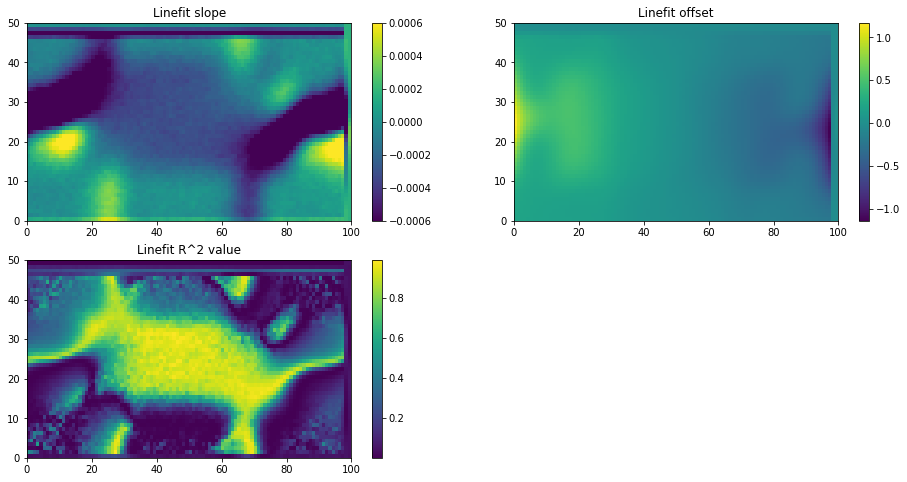

In [12]:
plt.figure(figsize=(16,8))
plt.subplot(2,2,1)
plt.pcolormesh(line1[0], cmap='viridis', vmin=-.0006, vmax=.0006)
plt.title('Linefit slope')
plt.colorbar()
plt.subplot(2,2,2)
plt.pcolormesh(line1[1],cmap='viridis')
plt.title('Linefit offset')
plt.colorbar()
plt.subplot(2,2,3)
plt.pcolormesh(line1[2],cmap='viridis')
plt.title('Linefit R^2 value')
plt.colorbar()

# Spatial sinefit amplitude

In [13]:
interact(cube_line_plot, data1=fixed(sine1[0]),title1=fixed('Sinefit amplitude'),phi1=Bz,x_pos=200,y_pos=100,B_arr=fixed(Bz),scale=fixed(scale),data_min=(sine1[0].min()),data_max=sine1[0].max(),color=fixed(color),angles=fixed(Bz))

interactive(children=(Dropdown(description='phi1', options=(-0.5, -0.48, -0.43, -0.35, -0.25, 0.0, 0.13, 0.25,…

<function __main__.cube_line_plot(data1, phi1, title1, angles, x_pos, y_pos, B_arr, scale, data_min, data_max, color)>

# Spatial sinefit phase

In [14]:
interact(cube_line_plot, data1=fixed(sine1[1]),title1=fixed('Sinefit phase (degrees)'),phi1=(Bz),x_pos=200,y_pos=100,B_arr=fixed(Bz),scale=fixed(scale),data_min=(0),data_max=sine1[1].max(),color=fixed(color),angles=fixed(out_of_plane))

interactive(children=(Dropdown(description='phi1', options=(-0.5, -0.48, -0.43, -0.35, -0.25, 0.0, 0.13, 0.25,…

<function __main__.cube_line_plot(data1, phi1, title1, angles, x_pos, y_pos, B_arr, scale, data_min, data_max, color)>

# Spatial sinefit offset

In [15]:
interact(cube_line_plot, data1=fixed(sine1[2]),title1=fixed('Sinefit offset'),phi1=Bz,x_pos=200,y_pos=100,B_arr=fixed(Bz),scale=fixed(scale),data_min=(sine1[2].min()),data_max=sine1[2].max(),color=fixed(color),angles=fixed(out_of_plane))

interactive(children=(Dropdown(description='phi1', options=(-0.5, -0.48, -0.43, -0.35, -0.25, 0.0, 0.13, 0.25,…

<function __main__.cube_line_plot(data1, phi1, title1, angles, x_pos, y_pos, B_arr, scale, data_min, data_max, color)>

# Perpendicular contacts only show up in amplitude

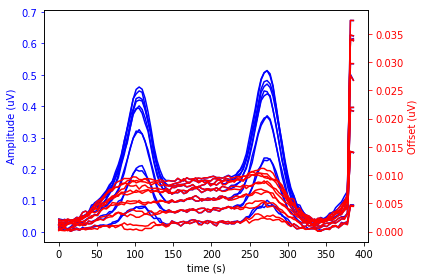

In [16]:
fig, ax1 = plt.subplots()
s1 = sine1[0][5,:]
ax1.plot(np.arange(0,scale*len(sine1[0][1,:,0]),scale), s1, 'b-')
ax1.set_xlabel('time (s)')
# Make the y-axis label, ticks and tick labels match the line color.
ax1.set_ylabel('Amplitude (uV)', color='b')
ax1.tick_params('y', colors='b')

ax2 = ax1.twinx()
s2 = -sine1[2][5,:]
ax2.plot(np.arange(0,scale*len(sine1[2][1,:,0]),scale), s2, 'r-')
ax2.set_ylabel('Offset (uV)', color='r')
ax2.tick_params('y', colors='r')

fig.tight_layout()
plt.show()


In [148]:
#interact(cube_line_plot_4D_pointer, data1=fixed(pc1),title1=fixed('Reflection (drift-corrected)'),phase=fixed(0),theta1=(0,340,20),phi1=(out_of_plane),x_pos=100,y_pos=100,scale=fixed(scale),data_min=(rf1.min()),data_max=rf1.max(),color=fixed(color))

# Sinefit quality check

In [17]:
interact(cube_linefit_plot, data1=fixed(sse),title1=fixed('Spatial photovoltage'),data2=fixed(sine1),data3=fixed(rf1),title3=fixed('Reflection'), theta1=(0,340,20),phi1=Bz,x_pos=200,y_pos=100,B_arr=fixed(Bz),data_min=(-2), data_max=(2), scale=fixed(scale),color=fixed(color))

interactive(children=(IntSlider(value=160, description='theta1', max=340, step=20), Dropdown(description='phi1…

<function __main__.cube_linefit_plot(data1, title1, data2, data3, title3, theta1, phi1, x_pos, y_pos, B_arr, scale, data_min, data_max, color)>

In [ ]:
interact(cube_plot_4D, data1=fixed(sse),title1=fixed('Seebeck-subtracted photovoltage'),theta1=(0,340,20),phase=fixed(90),phi1=(Bz),x_pos=200,y_pos=100,B_arr=fixed(Bz),scale=fixed(scale),color=fixed(color))

In [ ]:
interact(cube_plot_3D, data1=fixed(sine1[1]),title1=fixed('Sinefit phase'),phi1=Bz,x_pos=200,theta1=fixed(0),y_pos=100,B_arr=fixed(Bz),scale=fixed(scale),data_min=(sine1[0].min()),data_max=sine1[0].max(),color=fixed(color),angles=fixed(Bz))

# Terraced Hall cross results

In [20]:
directory2 = '2018/2018_06/' #where the data at?
scale2 = 3.9; #number of microns per pixel (may vary depending on resolution of scan)
color2 = 'viridis' #plot color
#out_of_plane = np.array([-85,-75,-60,-45,-30,0,15,30,45,60,75,85])
#in_plane=np.arange(0,340,20)
#Bz=np.zeros([len(out_of_plane)])
#for i in range(len(out_of_plane)):
#    Bz[i]=round(0.5*np.sin(out_of_plane[i]/57.3),2)

In [21]:
jun_run1 = 'jun_master_pci_corrected_pow_adj'
jun_run2 = 'jun_master_rfi_corrected_pow_adj'
jun_run3 = 'jun_master_sinefit_pow_adj'
jun_run4 = 'jun_master_seebeck_subtracted_pow_adj'
jun_run5 = 'jun_master_seebeck_pow_adj'
jun_run6 = 'jun_master_seebeck_avg_pow_adj'
jun_run7 = 'jun_master_linefit'

jun_pc1 = np.load(join(directory2,jun_run1+'.npy'))
jun_rf1 = np.load(join(directory2,jun_run2+'.npy'))
jun_sine1 = np.load(join(directory2,jun_run3+'.npy'))#[3,50,100,6] spatial sinefit parameters array. 
                                            #sine1[0] is amplitude, sine1[1] is phase, sine1[2] is offset
jun_line1 = np.load(join(directory2,jun_run7+'.npy'))#[2,50,100,6] spatial linefit parameters array.
                                            #line1[0] is slope, line1[1] is offset, line1[2] is R^2
    
jun_sse = np.load(join(directory2,jun_run4+'.npy')) #Seebeck effect subtracted photovoltage maps
jun_seeb = np.load(join(directory2,jun_run5+'.npy')) #Seebeck effect at different angles
jun_see_avg = np.load(join(directory2,jun_run6+'.npy')) #Seebeck effect averaged across all angles

![Contact roadmap](2018/2018_06/Hall_cross_Jun_01_2018_roadmap.png)

In [22]:
out_of_plane_jun = np.array([0,8,16,24,32])
Bz_jun=np.zeros([len(out_of_plane_jun)])
for i in range(len(out_of_plane_jun)):
    Bz_jun[i]=round(0.5*np.sin(out_of_plane_jun[i]/57.3),2)

In [23]:
interact(cube_line_plot_4D, data1=fixed(jun_sse),title1=fixed('Seebeck-subtracted photovoltage'),theta1=(0,340,20),
         phase=fixed(0),phi1=(Bz_jun),x_pos=200,y_pos=100,scale=fixed(scale),B_arr=fixed(Bz_jun),
         data_min=(jun_sse.min()),data_max=jun_sse.max(),color=fixed(color))

interactive(children=(IntSlider(value=160, description='theta1', max=340, step=20), Dropdown(description='phi1…

<function __main__.cube_line_plot_4D(data1, title1, theta1, phi1, phase, B_arr, x_pos, y_pos, scale, data_min, data_max, color)>

# Spatial sinefit amplitude

In [24]:
interact(cube_line_plot, data1=fixed(jun_sine1[0]),title1=fixed('Sinefit amplitude'),phi1=Bz_jun,x_pos=200,y_pos=100,B_arr=fixed(Bz_jun),scale=fixed(scale),data_min=(0,1.0),data_max=jun_sine1[0].max(),color=fixed(color),angles=fixed(Bz))

interactive(children=(Dropdown(description='phi1', options=(0.0, 0.07, 0.14, 0.2, 0.26), value=0.0), IntSlider…

<function __main__.cube_line_plot(data1, phi1, title1, angles, x_pos, y_pos, B_arr, scale, data_min, data_max, color)>

# Spatial sinefit phase

In [25]:
interact(cube_line_plot, data1=fixed(jun_sine1[1]),title1=fixed('Sinefit phase'),phi1=Bz_jun,x_pos=200,y_pos=100,B_arr=fixed(Bz_jun),scale=fixed(scale),data_min=(0,360),data_max=jun_sine1[1].max(),color=fixed(color),angles=fixed(Bz))

interactive(children=(Dropdown(description='phi1', options=(0.0, 0.07, 0.14, 0.2, 0.26), value=0.0), IntSlider…

<function __main__.cube_line_plot(data1, phi1, title1, angles, x_pos, y_pos, B_arr, scale, data_min, data_max, color)>

# Spatial sinefit offset

In [26]:
interact(cube_line_plot, data1=fixed(jun_sine1[2]),title1=fixed('Sinefit offset'),phi1=Bz_jun,x_pos=200,y_pos=100,B_arr=fixed(Bz_jun),scale=fixed(scale),data_min=(jun_sine1[2].min()),data_max=jun_sine1[2].max(),color=fixed(color),angles=fixed(Bz))

interactive(children=(Dropdown(description='phi1', options=(0.0, 0.07, 0.14, 0.2, 0.26), value=0.0), IntSlider…

<function __main__.cube_line_plot(data1, phi1, title1, angles, x_pos, y_pos, B_arr, scale, data_min, data_max, color)>